# imports and settings

In [1]:
from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import anndata as ad
import faiss
import sys
import heapq
from math import sqrt

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
Using TensorFlow backend.


In [2]:
sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# functions

In [3]:
def ij2ind(i,j,rows=256):
    return i+j*rows

In [4]:
def get_adata_pixel(a):
    in_X = a.uns['IMS']
    matters_list = np.array(a.var_names)
    # obs_name = cell_list
    obs_name = map(str,range(in_X.shape[0]))
    g = map(str,matters_list)
    # g = matters_list

    obs = pd.DataFrame(index=obs_name)

    # var_name must be str
    var = pd.DataFrame(index=g)

    adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
    a_tmp = np.arange(65536)
    a_tmp_sq = a_tmp.reshape(256,256)
    x_list = [np.where(a_tmp_sq==i)[0][0] for i in a_tmp]
    y_list = [np.where(a_tmp_sq==i)[1][0] for i in a_tmp]
    x_list = np.array(x_list)
    y_list = np.array(y_list)
    
    adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
#     adata.obs['spatial_x'] = y_list
#     adata.obs['spatial_y'] = x_list
    return adata

In [5]:
# partition IMS as grid
def get_grid_label(grid_sz):
    pixel_label_mat = np.zeros(shape=(256,256))

    # cell_pos and cell_idx both starts with 1

    # grid_sz = 8
    n_grid_per_row = 256/grid_sz
    k=0
    for i in range(256):
        for j in range(256):
            grid_idx_i = np.floor(i/grid_sz)
            grid_idx_j = np.floor(j/grid_sz)
            grid_idx = grid_idx_i+grid_idx_j*n_grid_per_row+1

            pixel_label_mat[i,j] = grid_idx
            k+=1
    return pixel_label_mat


def make_adata_by_pixellabel(a,pixel_label_mat):
    # 已知pixel_label_mat，重构出一个a。这样方便之后的super pixel。要求：从1开始。没mask到的背景为0
    # 先把pixel_label_mat处理成从1开始的连续
    IMS = a.uns['IMS'].copy()
    num_cells = int(pixel_label_mat.max())
    train_x = []
    cell_idx = []
    cell_pos = []
    for i in range(num_cells):
        cur_idx = i+1

        cur_pixels_i,cur_pixels_j = np.where(pixel_label_mat==cur_idx)
        cur_pixels_idx = [ij2ind(cur_pixels_i[k],cur_pixels_j[k]) for k in range(len(cur_pixels_i))]
        cur_train_x = IMS[cur_pixels_idx,:]
        cur_cell_idx = np.array([cur_idx]*len(cur_pixels_i))
        cur_cell_pos = np.array(cur_pixels_idx)+1
        train_x.append(cur_train_x)
        cell_idx.append(cur_cell_idx)
        cell_pos.append(cur_cell_pos)
    train_x = np.concatenate(train_x)
    cell_idx = np.concatenate(cell_idx)
    cell_pos = np.concatenate(cell_pos)

    mean_rep = SEAM.datasets.get_mean_representation(train_x,cell_idx,num_cells)

    obs = np.arange(num_cells).astype('str')
    var = a.var_names
    obs = pd.DataFrame(index=obs)
    var = pd.DataFrame(index=var)
    a_grid = ad.AnnData(mean_rep,obs=obs,var=var)
    a_grid.uns['IMS'] = IMS
    a_grid.uns['cell_idx'] = cell_idx
    a_grid.uns['cell_pos'] = cell_pos
    a_grid.uns['train_x'] = train_x

    return a_grid

In [6]:
1+1

2

# data loading

In [6]:
a = sc.read_h5ad('/home/yzy/projects/SEAM/SEAM_old/data/raw/mouse_liver_revision_raw.h5ad')

In [7]:
pixel_label_mat_16 = get_grid_label(16)
a_grid = make_adata_by_pixellabel(a,pixel_label_mat_16)

# Cut

### get segmented mask and cell position, and write into anndata

In [9]:
np.array(a_grid.var_names)

array(['50.01', '50.56', '51.02', '51.57', '52.02', '52.58', '53.02',
       '53.58', '54.04', '55.03', '56.04', '57.02', '58.02', '59.02',
       '59.99', '61.0', '62.01', '62.97', '63.58', '64.01', '65.01',
       '66.01', '67.03', '68.03', '69.01', '70.05', '71.03', '72.02',
       '73.03', '74.02', '75.0', '75.98', '76.99', '78.04', '78.96',
       '79.9', '80.99', '82.03', '83.04', '84.04', '85.05', '86.02',
       '87.03', '88.02', '89.01', '90.01', '91.0', '92.02', '93.04',
       '94.03', '95.02', '96.01', '97.0', '98.03', '99.05', '100.04',
       '101.05', '101.97', '102.98', '104.01', '105.01', '106.02',
       '107.02', '108.04', '109.04', '110.02', '111.04', '112.0',
       '113.07', '114.04', '115.06', '116.05', '117.02', '118.04',
       '119.02', '120.02', '121.02', '122.02', '123.02', '124.04',
       '125.06', '126.04', '127.07', '127.97', '129.05', '130.04',
       '131.03', '132.03', '133.06', '134.04', '135.03', '136.02',
       '137.03', '138.03', '139.05', '140.0

In [8]:
a_grid=SEAM.tl.Cut(a_grid)

setting obsm: spatial


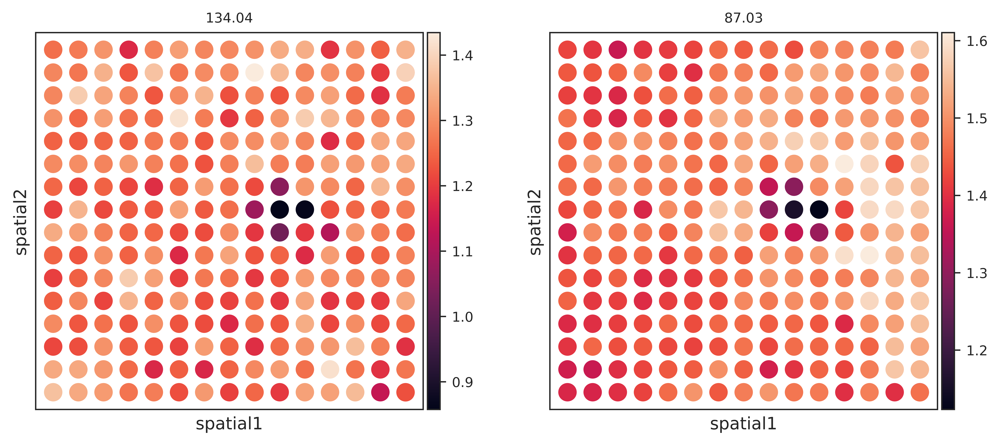

In [10]:
sc.pl.embedding(a_grid,basis='spatial',color=['134.04','87.03'])

### define flow function 

In [13]:
def get_flow_by_m(m,save=None):
    n_dot_row = int(np.sqrt(a_grid.shape[0]))

    # dpt_mat = np.array(a.obs['dpt_pseudotime'].copy()).reshape(n_dot_row,n_dot_row)
    # m = '134.48'
    # m = '255.83'
    # m = '87.36'
    dpt_mat = np.array(a_grid[:,m].X).reshape(n_dot_row,n_dot_row)
    x_mat = a_grid.obsm['spatial'][:,0].reshape(n_dot_row,n_dot_row)
    y_mat = a_grid.obsm['spatial'][:,1].reshape(n_dot_row,n_dot_row)
    # x_mat = 255-x_mat
    # x_mat = np.flipud(x_mat)
    # y_mat = np.flipud(y_mat)
    dpt_mat = np.flipud(dpt_mat)
    # dpt_mat = np.fliplr(dpt_mat)
    dx, dy = np.gradient(dpt_mat)


    cmp_list = 'gist_heat'
    # cmp_list = palettable.colorbrewer.diverging.Spectral_11.mpl_colormap
    # cmp_list = heatmap_cmp
    IMS_87 = a.uns['IMS'][:,np.where(a.var_names==m)].reshape(256,256)

    IMS_87_t = np.rot90(IMS_87,2)
    IMS_87_t = np.flip(IMS_87_t,axis=1)

    # ax = sc.pl.embedding(a,basis='spatial',color=['87.36'],show=False,color_map=SEAM.settings.heatmap_cmp)
    fig,ax = plt.subplots(1,1)
    ax.imshow((IMS_87_t),cmap=cmp_list)
    # ax.quiver(x_mat,y_mat,dy,dx,scale=5,color='w')
    # ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5,width=5)
    ax.quiver(x_mat+7.5,y_mat,dy,dx,angles='xy',color='w',scale=5,linewidths=0.7)
    ax.set_title('m/z '+m)
    ax.axis('off')
    if save is None:
        plt.show()
    else:
        plt.savefig(save,transparent=False,format='png',bbox_inches='tight')

### SIMS-flow selected metabolic features (87.36)

In [10]:
n_dot_row = int(np.sqrt(a_grid.shape[0]))

# dpt_mat = np.array(a.obs['dpt_pseudotime'].copy()).reshape(n_dot_row,n_dot_row)
# m = '134.48'
# m = '255.83'
m = '87.36'
dpt_mat = np.array(a_grid[:,m].X).reshape(n_dot_row,n_dot_row)
x_mat = a_grid.obsm['spatial'][:,0].reshape(n_dot_row,n_dot_row)
y_mat = a_grid.obsm['spatial'][:,1].reshape(n_dot_row,n_dot_row)
# x_mat = 255-x_mat
# x_mat = np.flipud(x_mat)
# y_mat = np.flipud(y_mat)
dpt_mat = np.flipud(dpt_mat)
# dpt_mat = np.fliplr(dpt_mat)
dx, dy = np.gradient(dpt_mat)

# y_mat = y_mat.max()-y_mat

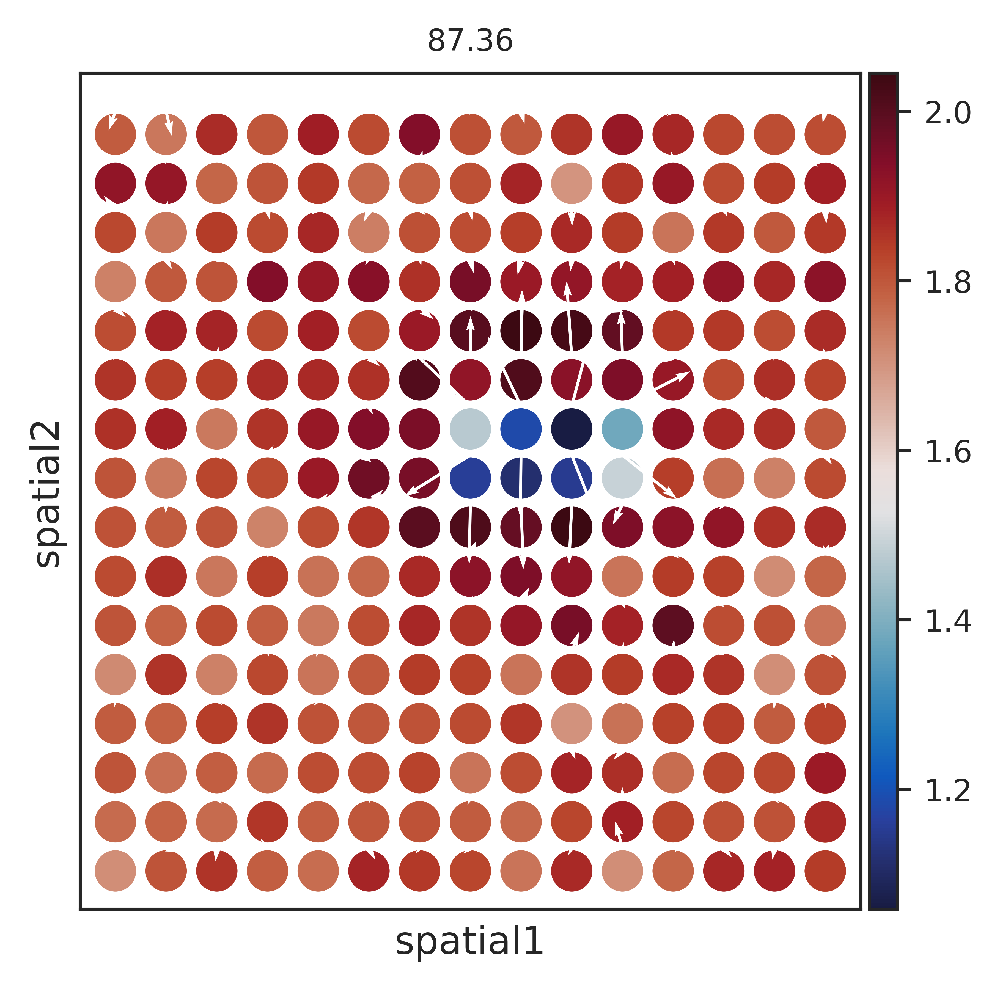

In [11]:
#
# SEAM.settings.heatmap_cmp
# fig,ax = plt.subplots()
ax = sc.pl.embedding(a_grid,basis='spatial',color=[m],show=False,color_map=SEAM.settings.heatmap_cmp)

ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5)

(-0.5, 255.5, 255.5, -0.5)

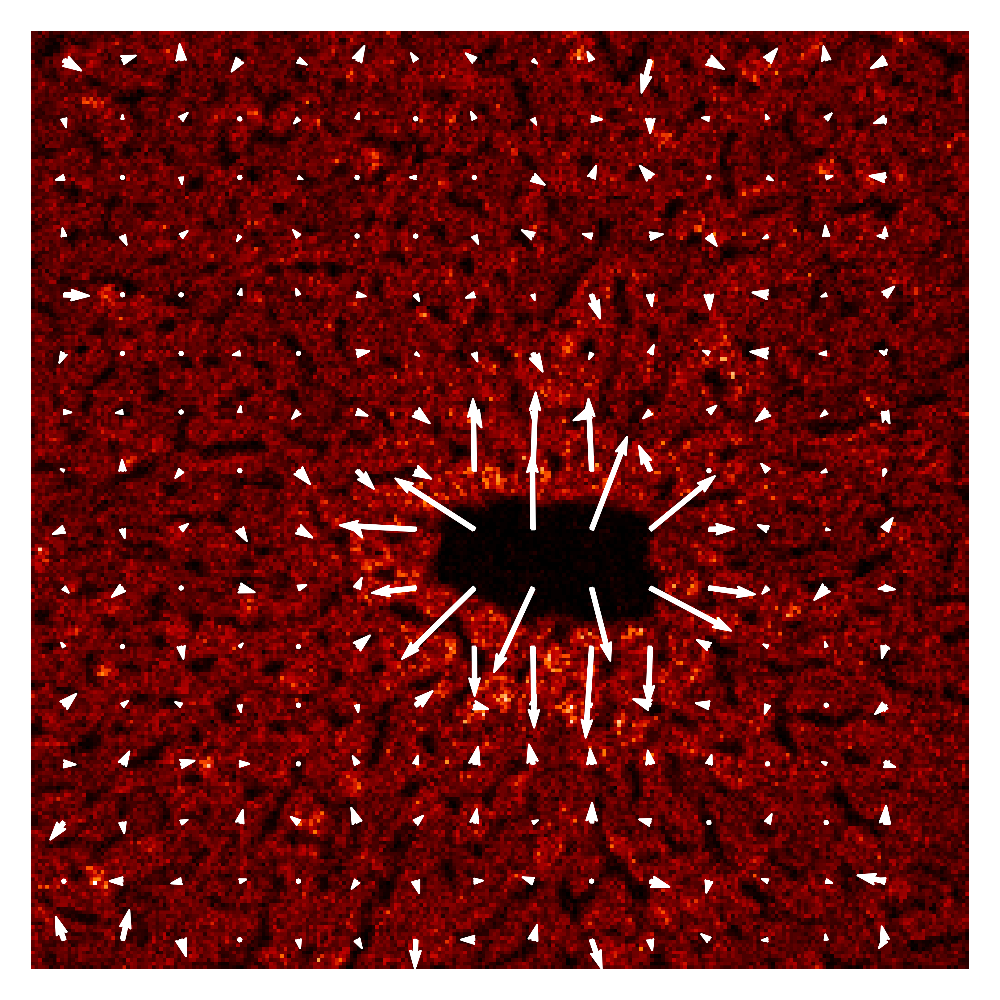

In [20]:
cmp_list = 'gist_heat'
# cmp_list = palettable.colorbrewer.diverging.Spectral_11.mpl_colormap
# cmp_list = heatmap_cmp
IMS_87 = a.uns['IMS'][:,np.where(a.var_names=='87.36')].reshape(256,256)

IMS_87_t = np.rot90(IMS_87,2)
IMS_87_t = np.flip(IMS_87_t,axis=1)

# ax = sc.pl.embedding(a,basis='spatial',color=['87.36'],show=False,color_map=SEAM.settings.heatmap_cmp)
fig,ax = plt.subplots(1,1)
ax.imshow((IMS_87_t),cmap=cmp_list)
# ax.quiver(x_mat,y_mat,dy,dx,scale=5,color='w')
# ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5,width=5)
ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5,linewidths=0.5)

ax.axis('off')

(-0.5, 255.5, 255.5, -0.5)

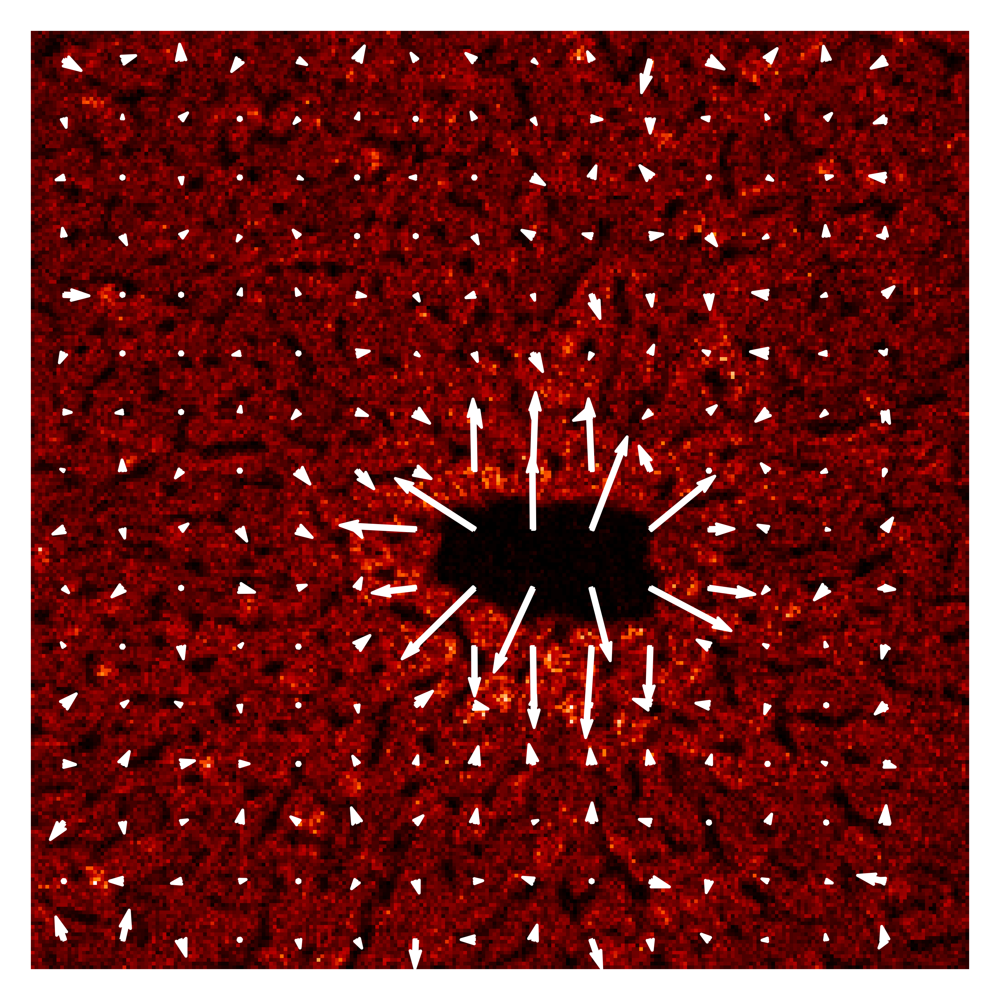

In [21]:
cmp_list = 'gist_heat'
# cmp_list = palettable.colorbrewer.diverging.Spectral_11.mpl_colormap
# cmp_list = heatmap_cmp
IMS_87 = a.uns['IMS'][:,np.where(a.var_names=='87.36')].reshape(256,256)

IMS_87_t = np.rot90(IMS_87,2)
IMS_87_t = np.flip(IMS_87_t,axis=1)

# ax = sc.pl.embedding(a,basis='spatial',color=['87.36'],show=False,color_map=SEAM.settings.heatmap_cmp)
fig,ax = plt.subplots(1,1)
ax.imshow((IMS_87_t),cmap=cmp_list)
# ax.quiver(x_mat,y_mat,dy,dx,scale=5,color='w')
# ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5,width=5)
ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5,linewidths=0.7)

ax.axis('off')

### SIMS-flow selected metabolic features (134.48)

In [15]:
n_dot_row = int(np.sqrt(a_grid.shape[0]))

# dpt_mat = np.array(a.obs['dpt_pseudotime'].copy()).reshape(n_dot_row,n_dot_row)
# m = '134.48'
# m = '255.83'
m = '134.48'
dpt_mat = np.array(a_grid[:,m].X).reshape(n_dot_row,n_dot_row)
x_mat = a_grid.obsm['spatial'][:,0].reshape(n_dot_row,n_dot_row)
y_mat = a_grid.obsm['spatial'][:,1].reshape(n_dot_row,n_dot_row)
# x_mat = 255-x_mat
# x_mat = np.flipud(x_mat)
# y_mat = np.flipud(y_mat)
dpt_mat = np.flipud(dpt_mat)
# dpt_mat = np.fliplr(dpt_mat)
dx, dy = np.gradient(dpt_mat)

# y_mat = y_mat.max()-y_mat

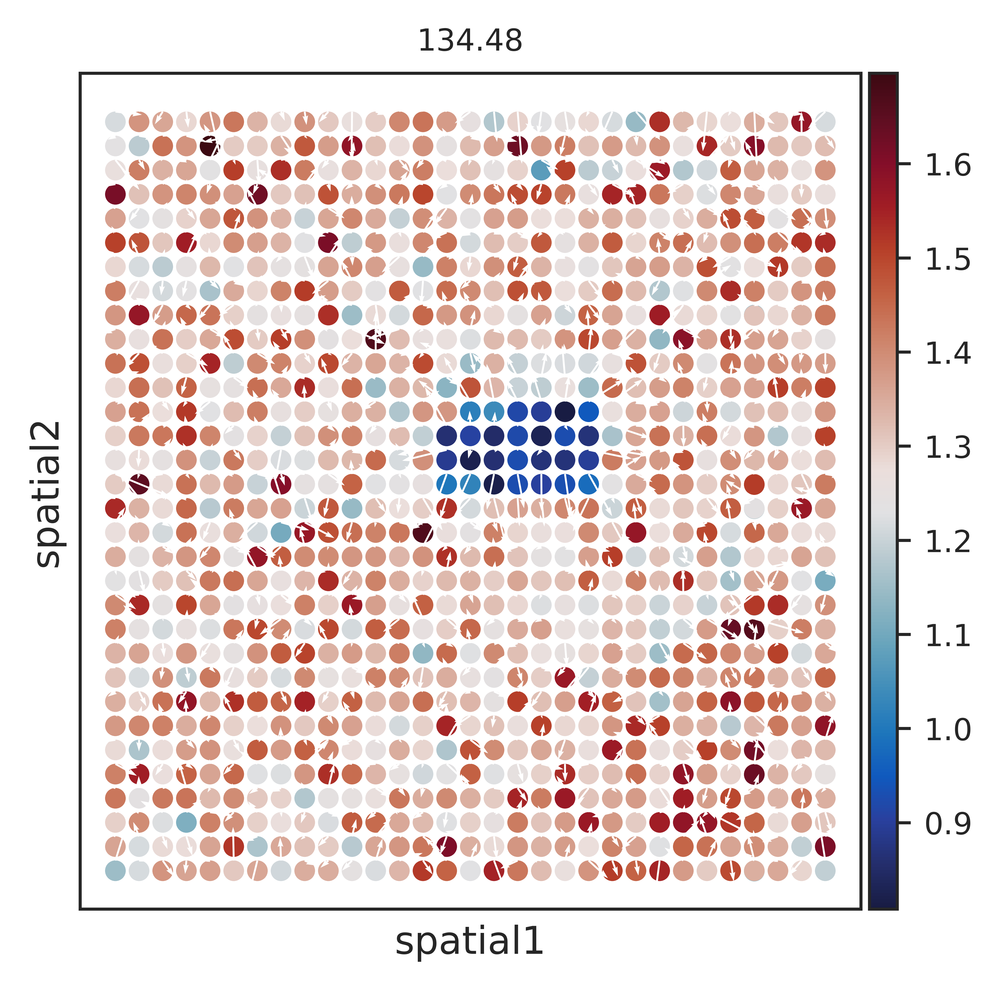

In [16]:
#
# SEAM.settings.heatmap_cmp
# fig,ax = plt.subplots()
ax = sc.pl.embedding(a_grid,basis='spatial',color=[m],show=False,color_map=SEAM.settings.heatmap_cmp)

ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5)

(-0.5, 255.5, 255.5, -0.5)

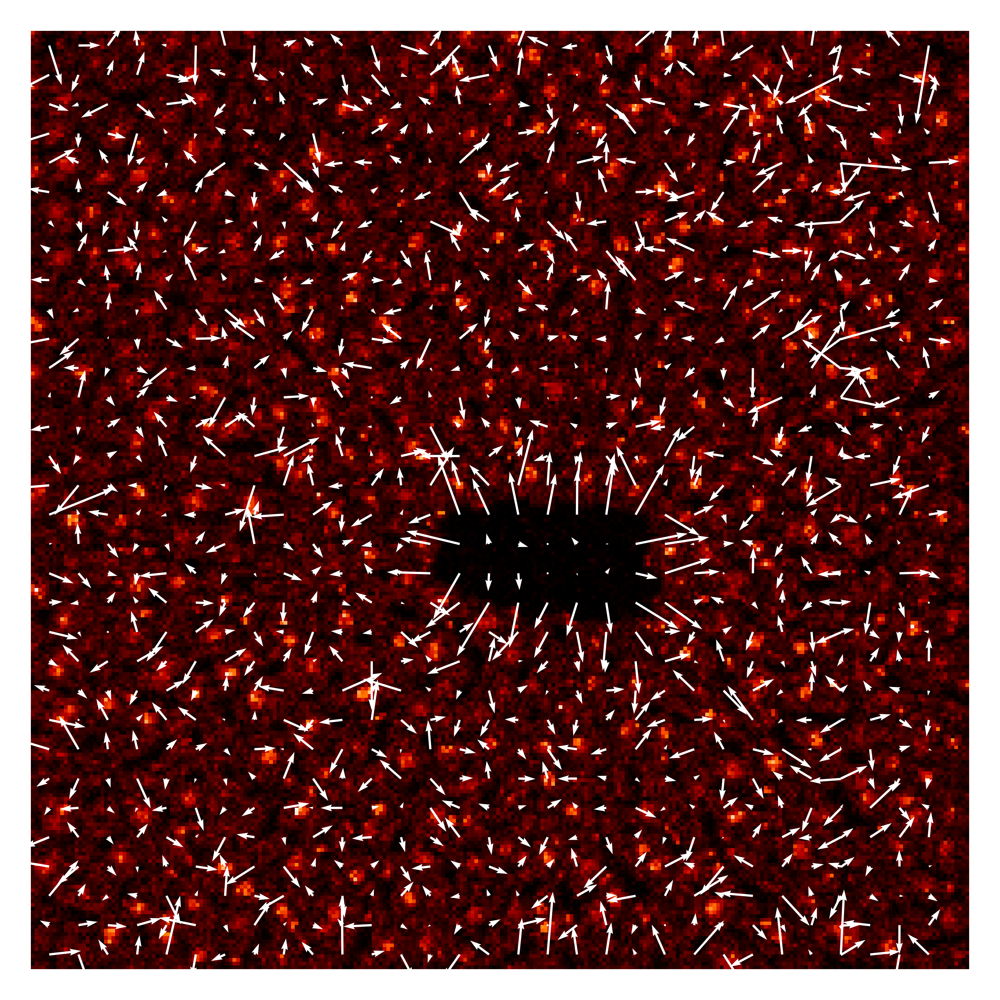

In [17]:
cmp_list = 'gist_heat'
IMS_87 = a.uns['IMS'][:,np.where(a.var_names=='134.48')].reshape(256,256)

IMS_87_t = np.rot90(IMS_87,2)
IMS_87_t = np.flip(IMS_87_t,axis=1)

# ax = sc.pl.embedding(a,basis='spatial',color=['87.36'],show=False,color_map=SEAM.settings.heatmap_cmp)
fig,ax = plt.subplots(1,1)
ax.imshow((IMS_87_t),cmap=cmp_list)
# ax.quiver(x_mat,y_mat,dy,dx,scale=5,color='w')
ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5)
ax.axis('off')

### SIMS-flow selected metabolic features (101)

In [20]:
n_dot_row = int(np.sqrt(a_grid.shape[0]))

# dpt_mat = np.array(a.obs['dpt_pseudotime'].copy()).reshape(n_dot_row,n_dot_row)
# m = '134.48'
# m = '255.83'
m = '101.41'
dpt_mat = np.array(a_grid[:,m].X).reshape(n_dot_row,n_dot_row)
x_mat = a_grid.obsm['spatial'][:,0].reshape(n_dot_row,n_dot_row)
y_mat = a_grid.obsm['spatial'][:,1].reshape(n_dot_row,n_dot_row)
# x_mat = 255-x_mat
# x_mat = np.flipud(x_mat)
# y_mat = np.flipud(y_mat)
dpt_mat = np.flipud(dpt_mat)
# dpt_mat = np.fliplr(dpt_mat)
dx, dy = np.gradient(dpt_mat)

# y_mat = y_mat.max()-y_mat

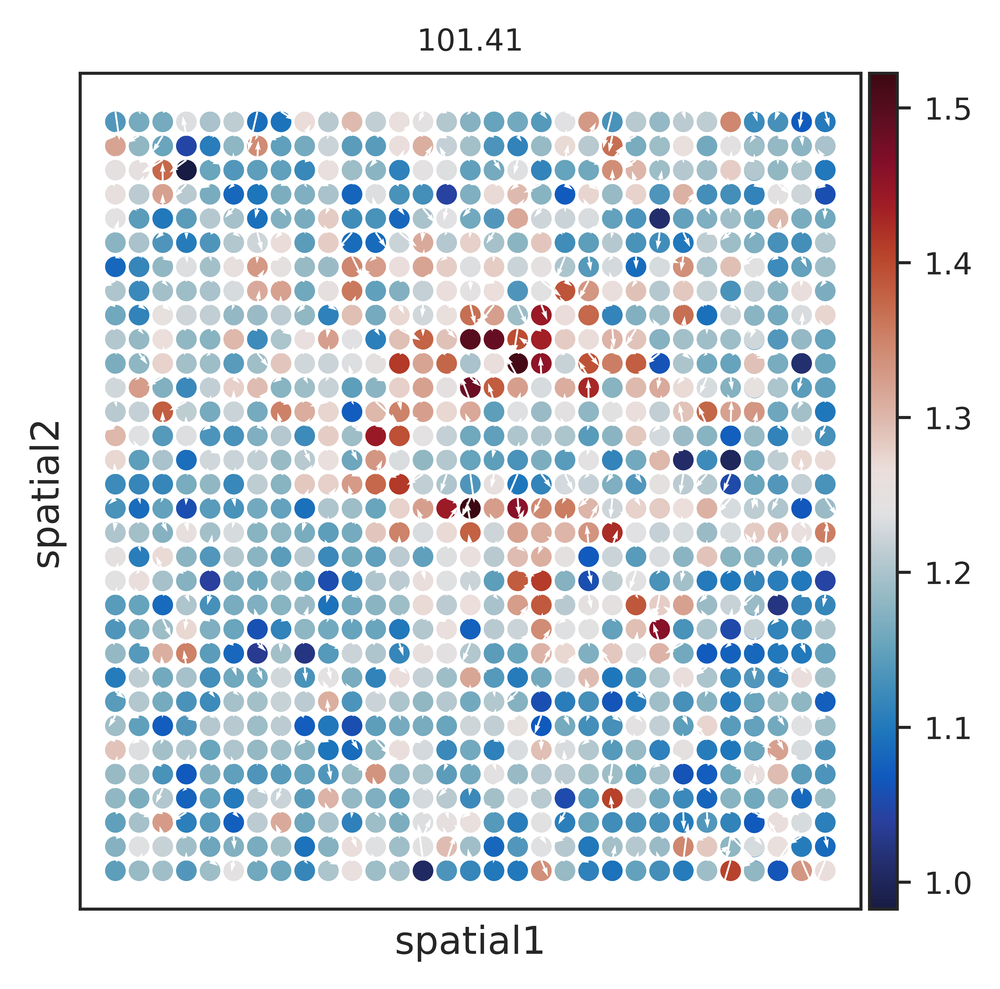

In [21]:
#
# SEAM.settings.heatmap_cmp
# fig,ax = plt.subplots()
ax = sc.pl.embedding(a_grid,basis='spatial',color=[m],show=False,color_map=SEAM.settings.heatmap_cmp)

ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5)

(-0.5, 255.5, 255.5, -0.5)

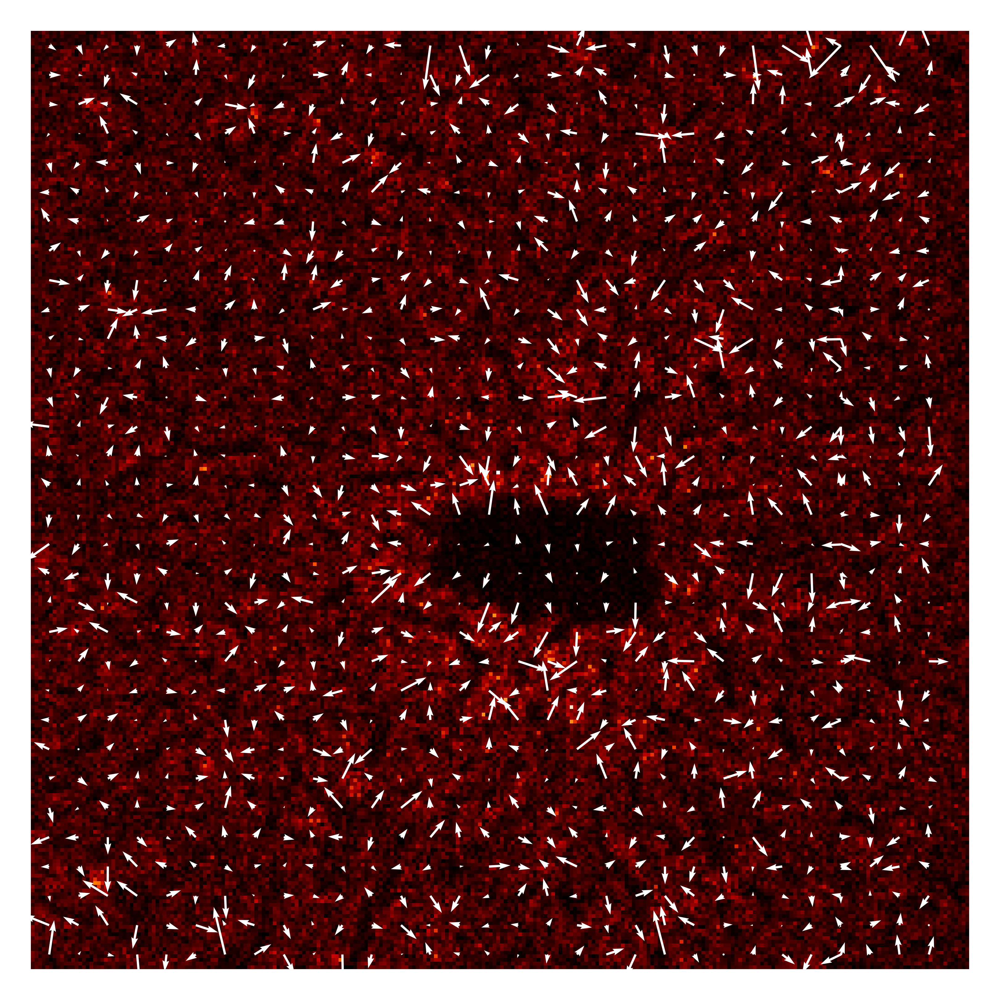

In [23]:
cmp_list = 'gist_heat'
IMS_87 = a.uns['IMS'][:,np.where(a.var_names==m)].reshape(256,256)

IMS_87_t = np.rot90(IMS_87,2)
IMS_87_t = np.flip(IMS_87_t,axis=1)

# ax = sc.pl.embedding(a,basis='spatial',color=['87.36'],show=False,color_map=SEAM.settings.heatmap_cmp)
fig,ax = plt.subplots(1,1)
ax.imshow((IMS_87_t),cmap=cmp_list)
# ax.quiver(x_mat,y_mat,dy,dx,scale=5,color='w')
ax.quiver(x_mat,y_mat,dy,dx,angles='xy',color='w',scale=5)
ax.axis('off')

### multiple m

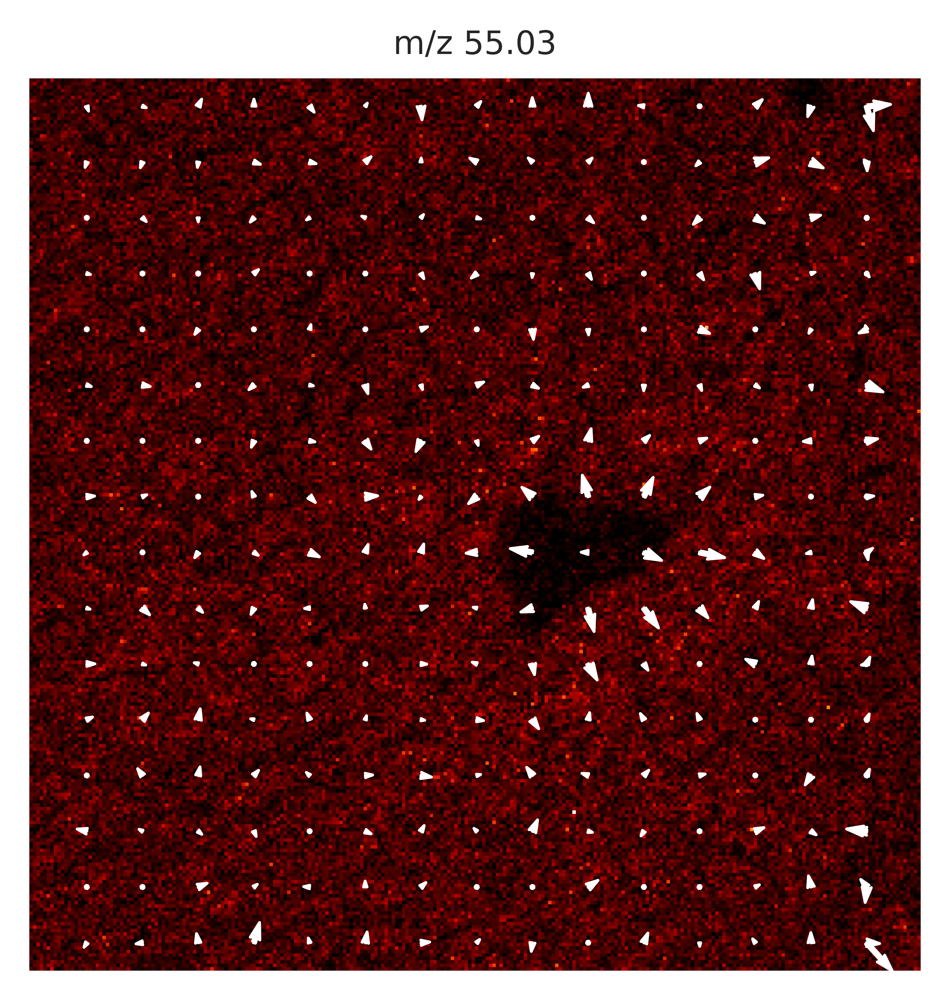

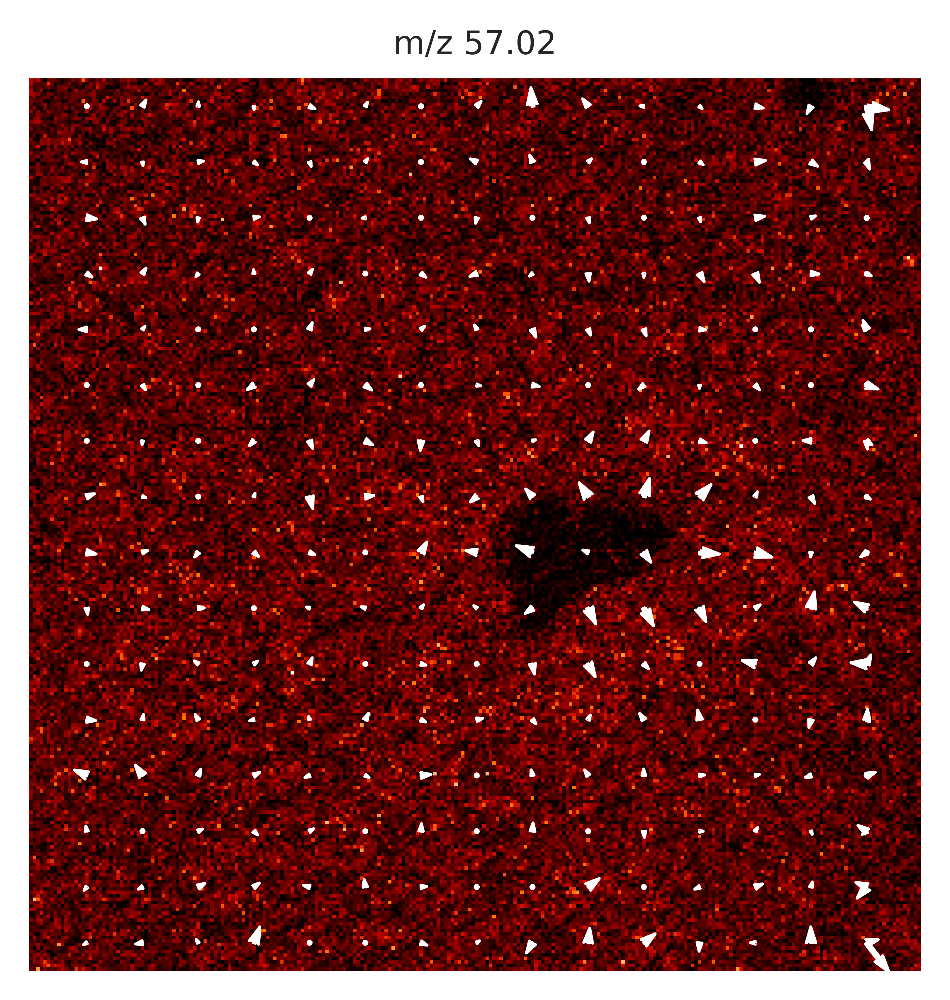

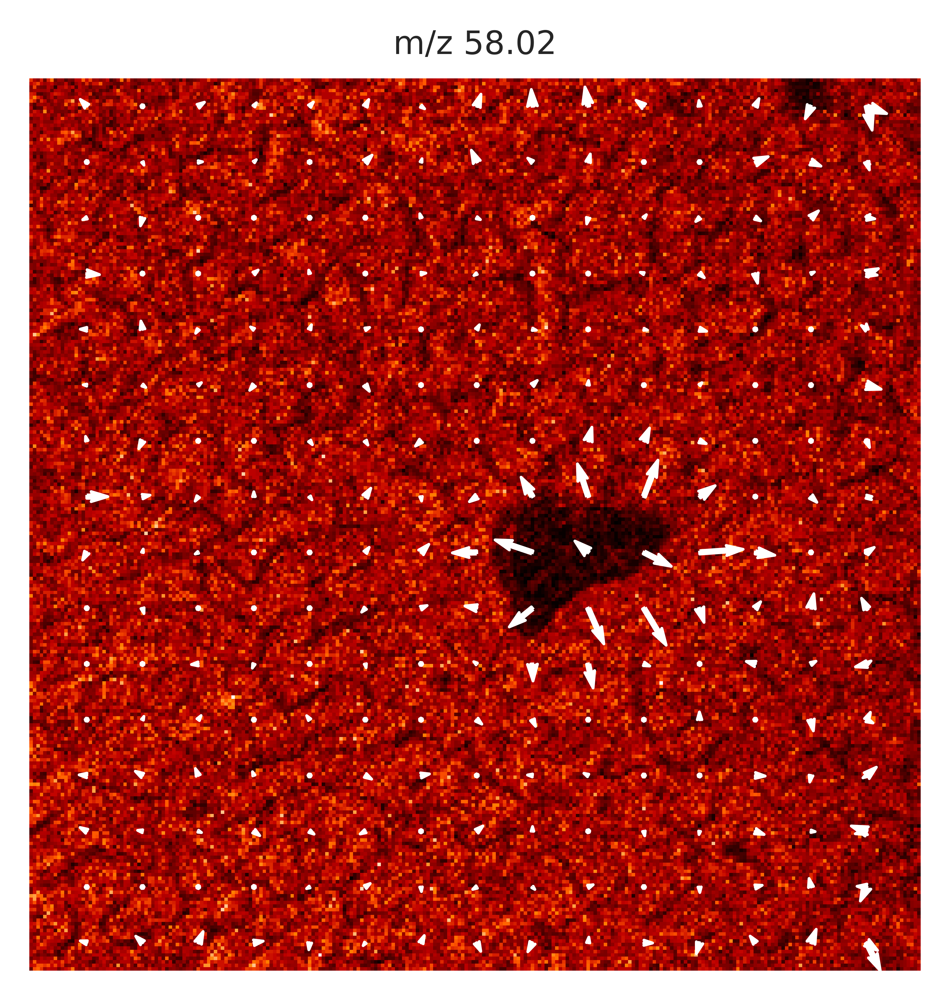

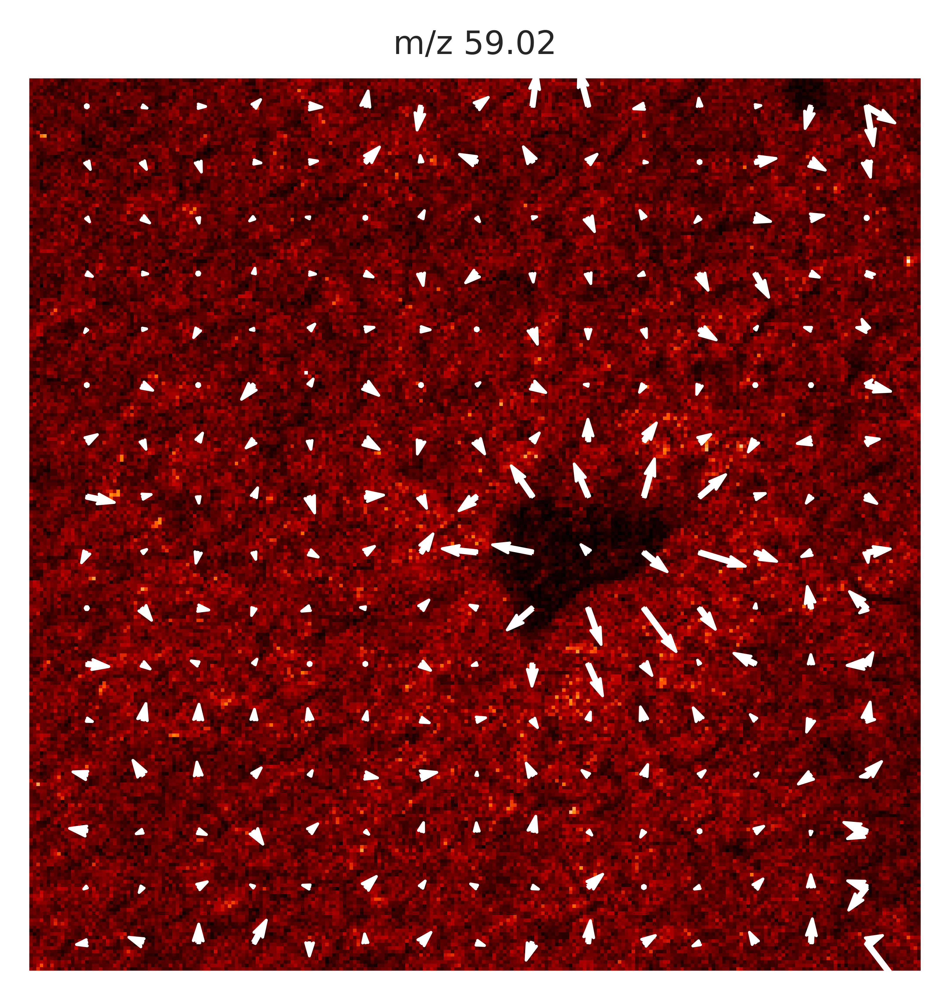

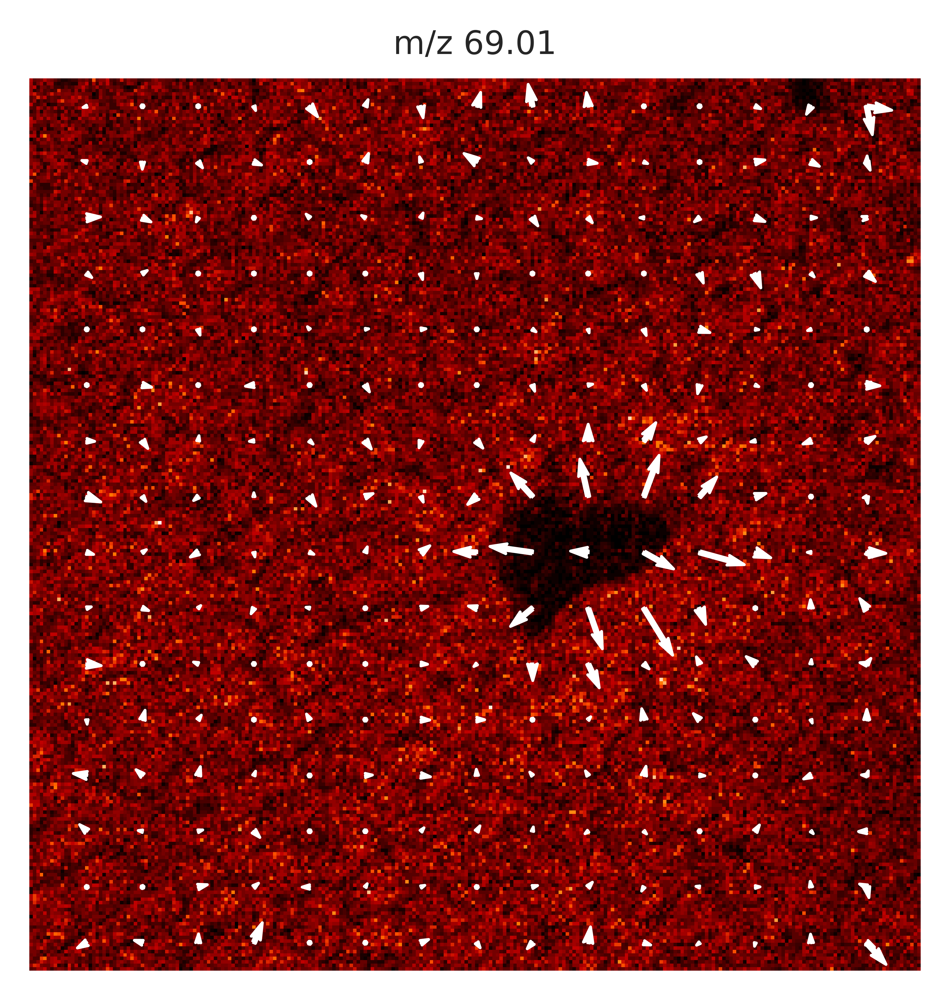

...

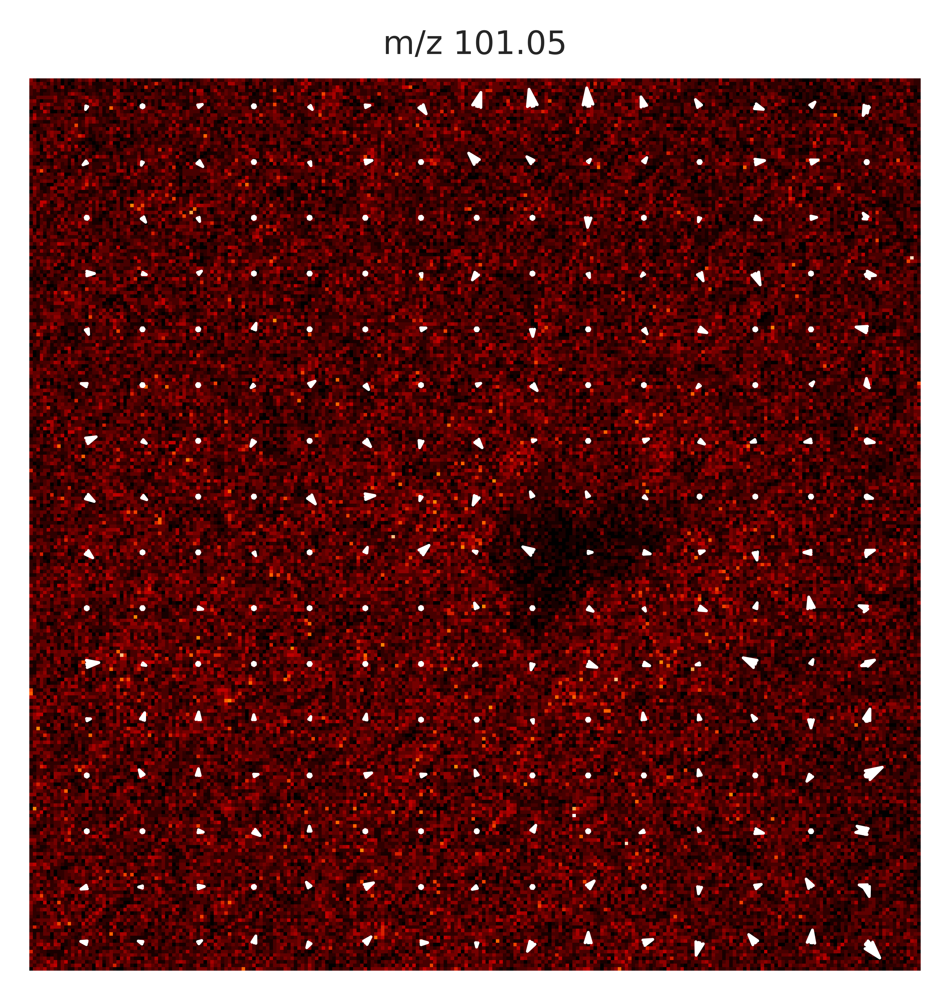

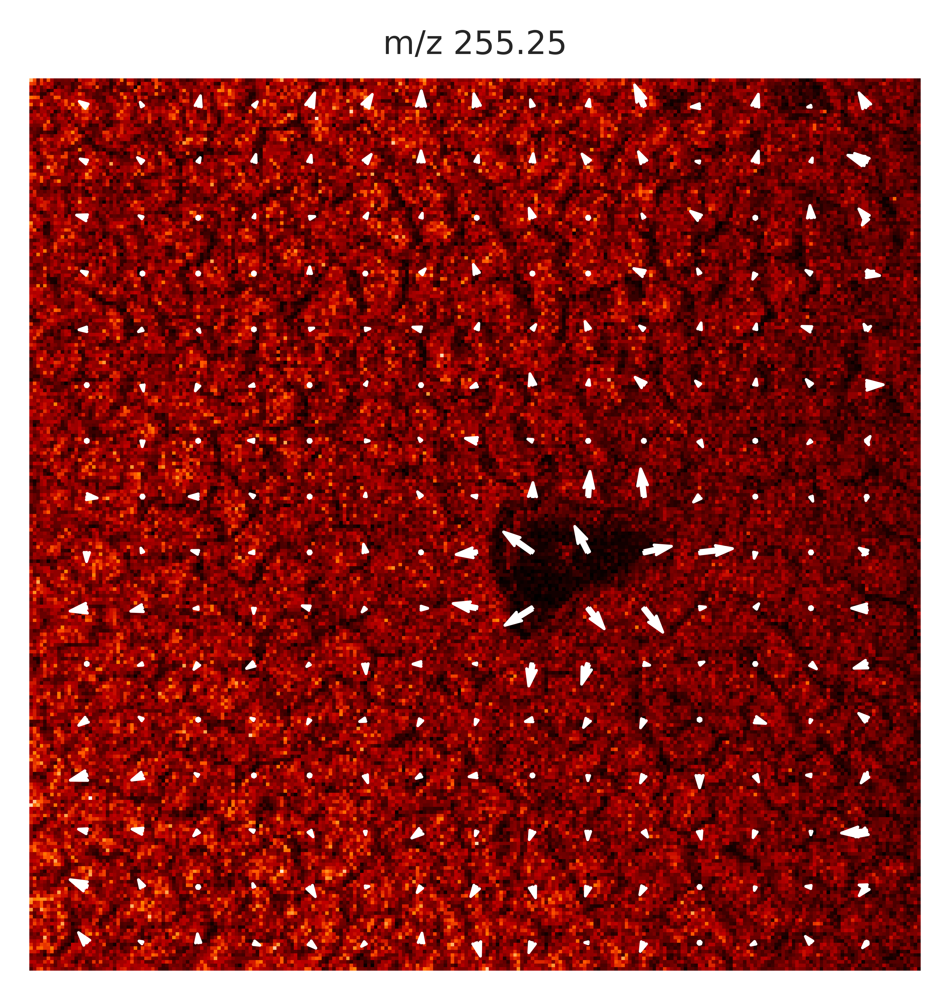

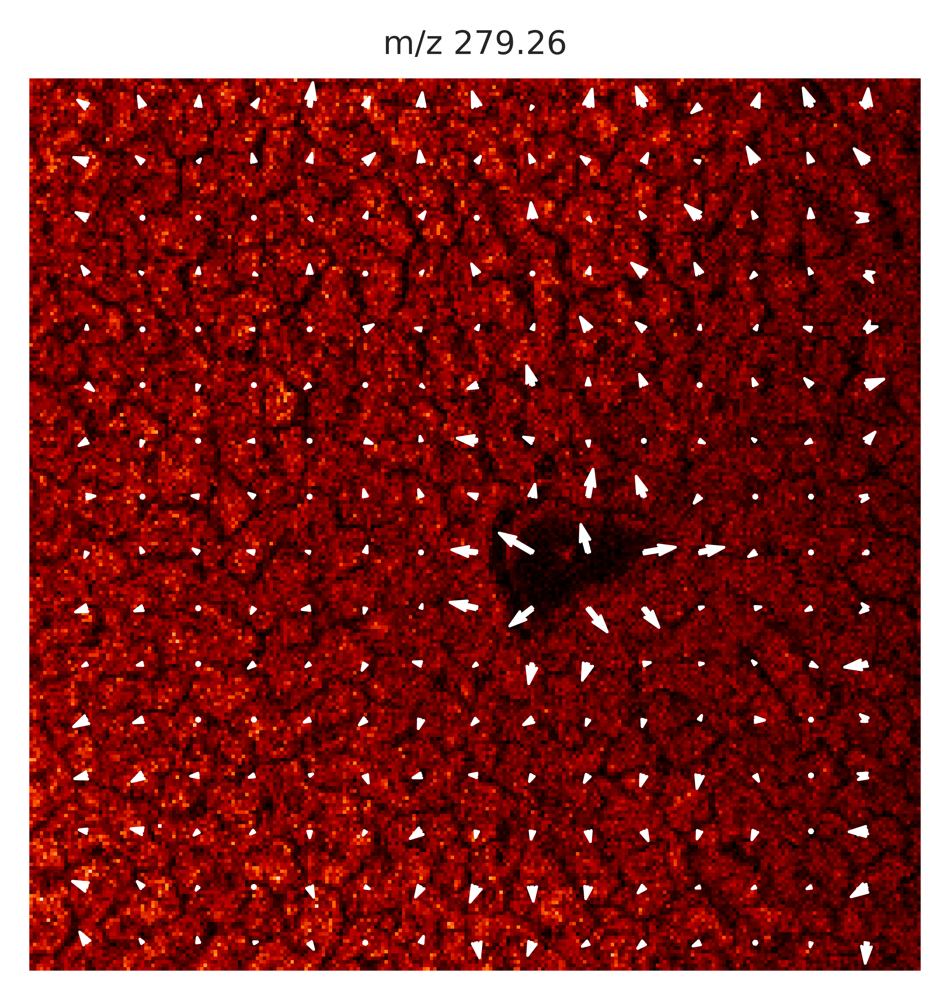

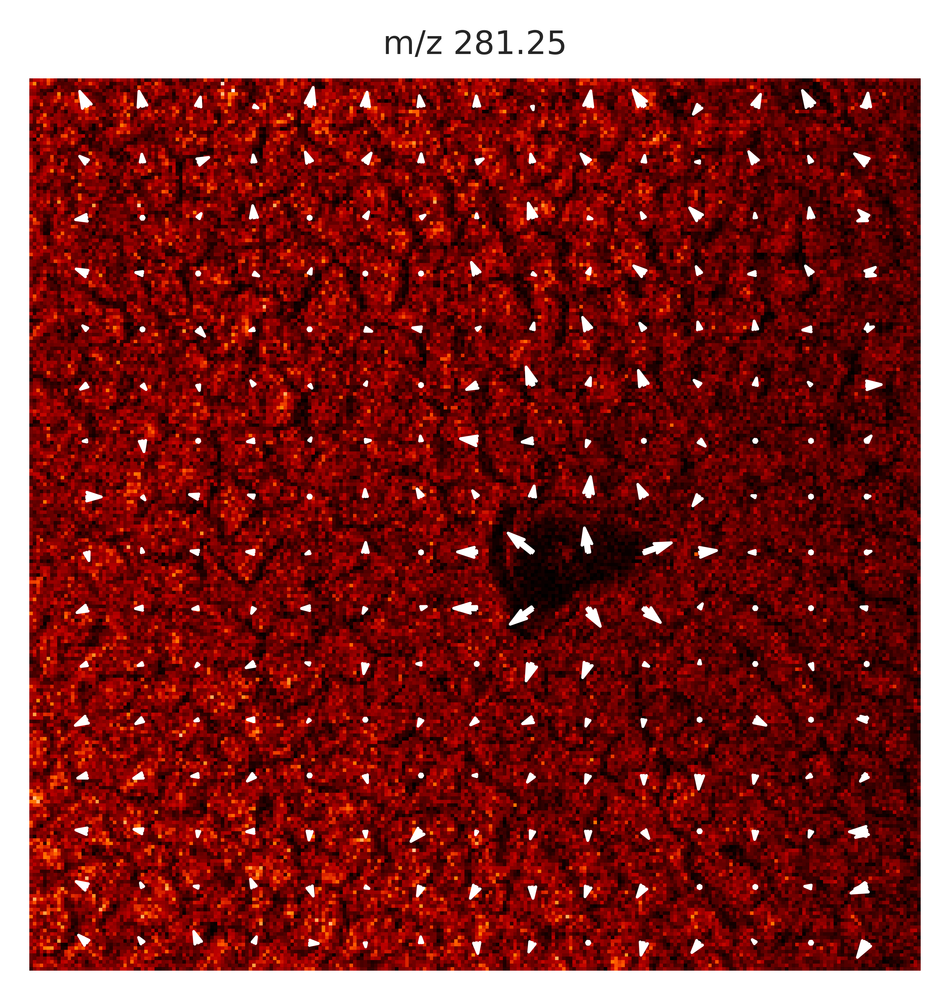

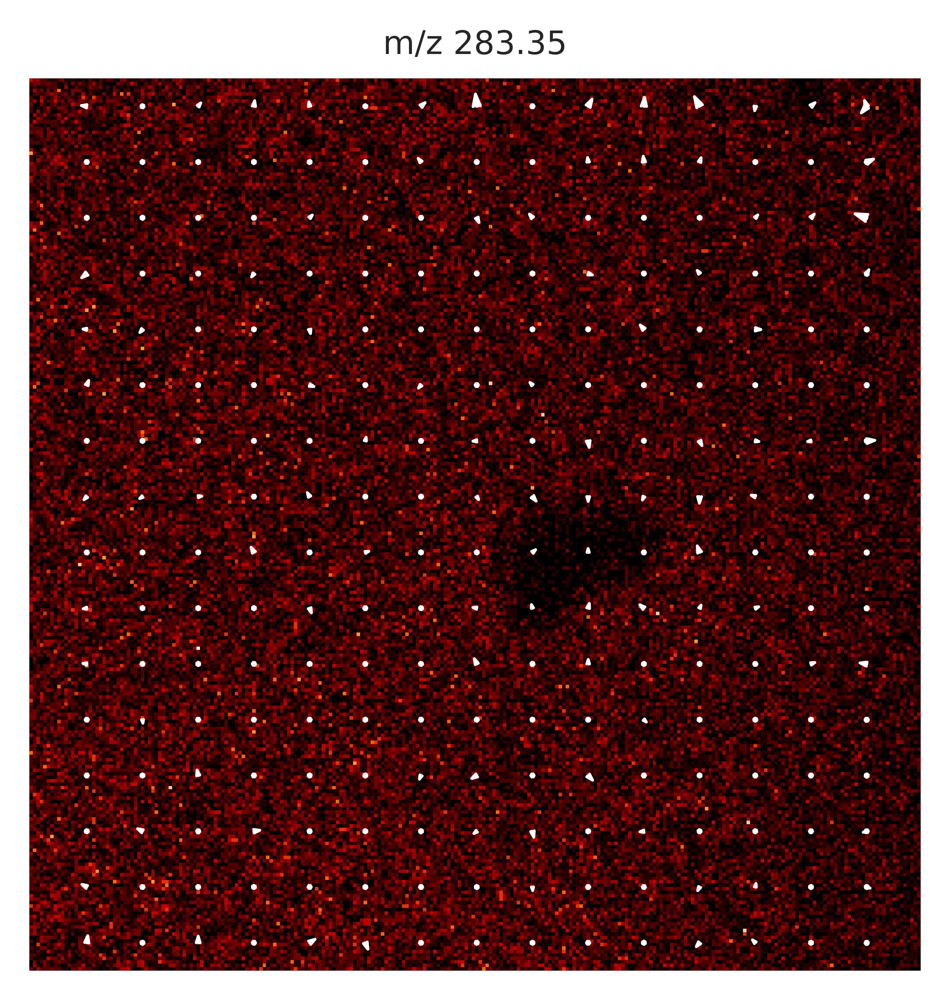

In [14]:
m_list = [
    '55.03','57.02','58.02','59.02','69.01','71.03','73.03','87.03','101.05',
#     '134.48',
    '255.25','279.26','281.25','283.35'

]
for m in m_list:
    save_path = 'flow_figure/grid16_revision/{0}.png'.format(m)
    get_flow_by_m(m,save_path)